# **Proyek Analisis Data: E-Commerce Public Dataset**
- **Nama:** Doni Maulana Syahputra
- **Email:** donimaulanas44@gmail.com
- **ID Dicoding:** maulanadoni

## **Menentukan Pertanyaan Bisnis**

- Pertanyaan 1: Bagaimana Performa penjualan pada beberapa tahun terakhir dalam skala per bulan? (performa banyaknya order dan total revenue per month) done
- Pertanyaan 2: Produk apa yang paling menghasilkan revenue dan paling laku serta produk paling tidak laku dan tidak menghasilkan revenue?
- Pertanyaan 3: State apa yang menghasilkan revenue dan jumlah order paling tinggi?
- Pertanyaan 4: Metode pembayaran apa yang paling banyak jumlah pembayarannya dan sering digunakan  dari berbagai states?
- Pertanyaan 5: RFM Analysis
- Pertanyaan 6: Bagaimana jika distribusi customer berdasarkan lokasi geografis dalam bentuk map? (Geospatial Analysis)
- Pertanyaan 7: Bagaimana jika mengkategorikan customer berdasarkan jumlah total pengeluaran untuk pembelian produk di platform ini? (Clustering)

## **Import Semua Packages/Library yang Digunakan**

In [1]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print('Setup Complete!')

Setup Complete!


## **Data Wrangling**

### **Gathering Data**

In [2]:
# import data-data dalam format csv
customers_df = pd.read_csv('data/customers_dataset.csv')
orders_dataset_df = pd.read_csv('data/orders_dataset.csv')
order_items_df = pd.read_csv('data/order_items_dataset.csv')
order_payments_df = pd.read_csv('data/order_payments_dataset.csv')
order_reviews_df = pd.read_csv('data/order_reviews_dataset.csv')
products_df = pd.read_csv('data/products_dataset.csv')
products_english_df = pd.read_csv('data/product_category_name_translation.csv')
sellers_df = pd.read_csv('data/sellers_dataset.csv')
geolocation_df = pd.read_csv('data/geolocation_dataset.csv')
print('Data loaded.')

Data loaded.


In [3]:
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [4]:
orders_dataset_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [5]:
order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [6]:
order_payments_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [7]:
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [8]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [9]:
products_english_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [10]:
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [11]:
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


**Insight:**
- Pada dataframe order_items_df terdapat paling banyak column dengan foreign key.
- Analisis nanti kita harus men-translate product_category_name ke bahasa inggris dari column product_category_name_english
- Pada tabel geolocation_df, kita bisa analisis dengan library khusus untuk spatial analysis, seperti geopandas.
- Pada tabel order_reviews_df yang kita ambil hanya review_score saja

### **Assessing Data**

#### Check Data Type

In [12]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [13]:
orders_dataset_df.info()
# terlihat dtype tabel yang mengandung informasi waktu masih dalam bentuk object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [14]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [15]:
order_payments_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [16]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [17]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [18]:
sellers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [19]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


#### Check Missing Value

In [20]:
customers_df.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [21]:
orders_dataset_df.isna().sum()
# terdapat missing value pada beberapa kolom

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [22]:
order_items_df.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [23]:
order_payments_df.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [24]:
order_reviews_df.isna().sum()
# review_comment_title dan review_comment_message akan di-drop, karena tidak akan dianalisis sentimen di tahap selanjutnya.

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [25]:
products_df.isna().sum()
# terdapat missing value pada beberapa kolom

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [26]:
sellers_df.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [27]:
geolocation_df.isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

#### Check Duplicate Value

In [28]:
customers_df.duplicated().sum()

0

In [29]:
orders_dataset_df.duplicated().sum()

0

In [30]:
order_items_df.duplicated().sum()

0

In [31]:
order_payments_df.duplicated().sum()

0

In [32]:
order_reviews_df.duplicated().sum()

0

In [33]:
products_df.duplicated().sum()

0

In [34]:
sellers_df.duplicated().sum()

0

#### Check Inaccurate & Inconsistent Value

In [35]:
customers_df.customer_state.value_counts()

customer_state
SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: count, dtype: int64

In [36]:
orders_dataset_df['order_status'].value_counts()
# hanya order_status yang delivered yang akan dianalisis di tahap selanjutnya

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: count, dtype: int64

In [37]:
order_payments_df['payment_type'].value_counts()

payment_type
credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: count, dtype: int64

In [38]:
order_payments_df[order_payments_df['payment_type']=='not_defined']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0


|            |Data Type                      |Missing Value                      |Duplicate Value|Inaccurate Value|
|--------------------|-------------------------------|-----------------------------------|---------------|----------------|
|customers_df        |                               |                                   |               |                |
|orders_dataset_df   |order_purchase_timestamp       |order_approved_at = 160            |               |                |
|                    |order_approved_at              |order_delivered_carrier_date = 1783|               |                |
|                    |order_delivered_carrier_date   |order_delivered_customer_date =  2 |               |                |
|                    |order_delivered_customer_date  |                                   |               |                |
|                    |order_estimated_delivery_date  |                                   |               |                |
|order_items_df      |                               |                                   |               |                |
|order_payments_df   |                               |                                   |               |                |
|order_reviews_df    |                               |review_comment_title 87656         |               |                |
|                    |                               |review_comment_message 58247       |               |                |
|products_df         |                               |product_category_name = 610        |               |                |
|                    |                               |product_name_lenght = 610          |               |                |
|                    |                               |product_description_lenght = 610   |               |                |
|                    |                               |product_photos_qty =  610          |               |                |
|                    |                               |product_weight_g =  2              |               |                |
|                    |                               |product_length_cm =  2             |               |                |
|                    |                               |product_height_cm =  2             |               |                |
|                    |                               |product_width_cm = 2               |               |                |
|products_english_df |                               |                                   |               |                |
|sellers_df          |                               |                                   |               |                |
|geolocation_df      |                               |                                   |               |                |


**Insight:**
- Terdapat kesalahan data type pada table orders_dataset_df
- Terdapat missing value pada table orders_dataset_df, order_reviews_df, dan products_df
- Pada kolom 'order_status' di tabel orders_dataset_df, hanya status yang delivered yang akan dianalisis nantinya, selain itu akan di-drop.
- Pada tabel order_reviews_df, hanya rating score yang akan dianalisis lebih lanjut, sisanya akan didrop seperti comment title, message, etc.

### **Cleaning Data**

#### orders_dataset_df

In [39]:
orders_dataset_df = orders_dataset_df[orders_dataset_df['order_status'] == 'delivered'].reset_index(drop=True)
orders_dataset_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [40]:
drop_columns = ['order_approved_at','order_delivered_carrier_date', 'order_delivered_customer_date']
orders_dataset_df.drop(drop_columns, axis=1, inplace=True)
orders_dataset_df.head()
#Orders_dataset selesai

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-26 00:00:00


In [41]:
columns_to_datetime = ['order_purchase_timestamp', 'order_estimated_delivery_date']
for column in columns_to_datetime:
    orders_dataset_df[column] = pd.to_datetime(orders_dataset_df[column])

In [42]:
orders_dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96478 entries, 0 to 96477
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96478 non-null  object        
 1   customer_id                    96478 non-null  object        
 2   order_status                   96478 non-null  object        
 3   order_purchase_timestamp       96478 non-null  datetime64[ns]
 4   order_estimated_delivery_date  96478 non-null  datetime64[ns]
dtypes: datetime64[ns](2), object(3)
memory usage: 3.7+ MB


#### order_reviews_df

In [43]:
order_reviews_df.head()
drop_columns = ['review_comment_message', 'review_comment_title', 'review_creation_date', 'review_answer_timestamp']
order_reviews_df.drop(drop_columns, axis=1, inplace=True)
order_reviews_df.head()

,review_id,order_id,review_score
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5


In [44]:
order_reviews_df.head()

,review_id,order_id,review_score
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5


#### products_df

In [45]:
# We need to translate the words from column product_category_name in products_df table to english to get a better understanding at the data.
products_df= pd.merge(left=products_df, right=products_english_df, how='left', on='product_category_name')

In [46]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares


In [47]:
# Since only 610 rows that have null values, removing these rows won't have significant impact to the analysis
products_df.dropna(inplace=True)

#### order_payments_df

In [48]:
order_payments_df.drop(order_payments_df.loc[order_payments_df['payment_type']=='not_defined'].index, inplace=True)

In [49]:
order_payments_df[order_payments_df['payment_type']=='not_defined']

,order_id,payment_sequential,payment_type,payment_installments,payment_value


In [50]:
order_payments_df.groupby('payment_type').count()

,order_id,payment_sequential,payment_installments,payment_value
payment_type,,,,
boleto,19784,19784,19784,19784
credit_card,76795,76795,76795,76795
debit_card,1529,1529,1529,1529
voucher,5775,5775,5775,5775


**Insight:**
- semua tabel sudah siap dan tahap selanjutnya harus di merge dengan tabel yang berkaitan agar bisa memunculkan insight
- geolocation akan dianalisis di akhir

## **Exploratory Data Analysis (EDA)**

### Explore customers_df

In [51]:
customers_df.describe(include="all")

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441.000000,99441,99441
unique,99441,96096,NaN,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,17,NaN,15540,41746
mean,NaN,NaN,35137.474583,NaN,NaN
std,NaN,NaN,29797.938996,NaN,NaN
min,NaN,NaN,1003.000000,NaN,NaN
25%,NaN,NaN,11347.000000,NaN,NaN
50%,NaN,NaN,24416.000000,NaN,NaN
75%,NaN,NaN,58900.000000,NaN,NaN


In [52]:
# jumlah customer dari berbagai state
customers_df.groupby('customer_state')['customer_id'].nunique().sort_values(ascending=False)

customer_state
SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_id, dtype: int64

In [53]:
# jumlah customer dari berbagai city
customers_df.groupby('customer_city')['customer_id'].nunique().sort_values(ascending=False)

customer_city
sao paulo         15540
rio de janeiro     6882
belo horizonte     2773
brasilia           2131
curitiba           1521
                  ...  
ibiara                1
rio espera            1
rio dos indios        1
rio dos cedros        1
lagoao                1
Name: customer_id, Length: 4119, dtype: int64

### Explore orders_dataset_df

In [54]:
# membuat variabel delivery time
delivery_time = orders_dataset_df["order_estimated_delivery_date"] - orders_dataset_df["order_purchase_timestamp"]
delivery_time = delivery_time.apply(lambda x: x.total_seconds())
orders_dataset_df["delivery_time"] = round(delivery_time/86400)

In [55]:
orders_dataset_df.describe(include="all")

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,delivery_time
count,96478,96478,96478,96478,96478,96478.000000
unique,96478,96478,1,NaN,NaN,NaN
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,NaN,NaN,NaN
freq,1,1,96478,NaN,NaN,NaN
mean,NaN,NaN,NaN,2018-01-01 23:29:31.939913984,2018-01-25 17:09:52.325711616,23.644188
min,NaN,NaN,NaN,2016-09-15 12:16:38,2016-10-04 00:00:00,2.000000
25%,NaN,NaN,NaN,2017-09-14 09:00:23.249999872,2017-10-05 00:00:00,18.000000
50%,NaN,NaN,NaN,2018-01-20 19:45:45,2018-02-16 00:00:00,23.000000
75%,NaN,NaN,NaN,2018-05-05 18:54:47,2018-05-28 00:00:00,28.000000
max,NaN,NaN,NaN,2018-08-29 15:00:37,2018-10-25 00:00:00,155.000000


### Explore orders_customers_df

In [56]:
# menambah column baru yaitu status untuk mengetahui status user aktif atau non aktif
customers_id_in_orders_df = orders_dataset_df.customer_id.tolist()
customers_df['status'] = customers_df['customer_id'].apply(lambda x: 'Active' if x in customers_id_in_orders_df else 'Non Active')
customers_df.sample(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status
48300,b5ded9bf40588418007caa3eec589c6b,66f271f1fcea9468fbaa6aaf5f78bb73,95590,tramandai,RS,Active
77263,11606ae54baae4efda562f7c8c14b46d,7d86feb80a0843ed43aef438f8c028b1,74823,goiania,GO,Active
59432,c1f0fe3bb2fc6c29afff6b671b1b27c0,6f30595d862b95418d7b8ecff5a7bcf6,27925,macae,RJ,Active
1263,52fbd9fb0561eb0384eb3e5649d2a640,f4371991881a328886a134bbc99cec9e,79332,corumba,MS,Active
17763,9f11f34a505da57000b47239048b9355,dfbd9c72a1a48c02a30aa64e3565fa73,6660,itapevi,SP,Active


In [57]:
customers_df.groupby('status').customer_id.count()

status
Active        96478
Non Active     2963
Name: customer_id, dtype: int64

In [58]:
orders_customers_df = pd.merge(left=orders_dataset_df, right=customers_df, how='left', on='customer_id')
orders_customers_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,delivery_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-13,19.0,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,Active
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-09-04,27.0,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,Active
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-15,26.0,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,Active
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-26,12.0,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,Active


In [59]:
# Jumlah order berdasarkan state
orders_customers_df.groupby('customer_state').order_id.nunique().sort_values(ascending=False).reset_index().head(10)

,customer_state,order_id
0,SP,40501
1,RJ,12350
2,MG,11354
3,RS,5345
4,PR,4923
5,SC,3546
6,BA,3256
7,DF,2080
8,ES,1995
9,GO,1957


In [60]:
# Jumlah order berdasarkan city
orders_customers_df.groupby(by="customer_city").order_id.nunique().sort_values(ascending=False).reset_index().head(10)

,customer_city,order_id
0,sao paulo,15045
1,rio de janeiro,6601
2,belo horizonte,2697
3,brasilia,2071
4,curitiba,1489
5,campinas,1406
6,porto alegre,1342
7,salvador,1188
8,guarulhos,1144
9,sao bernardo do campo,911


### Explore order_payment_df

In [61]:
order_payments_df.describe(include='all')

,order_id,payment_sequential,payment_type,payment_installments,payment_value
count,103883,103883.000000,103883,103883.000000,103883.000000
unique,99437,NaN,4,NaN,NaN
top,fa65dad1b0e818e3ccc5cb0e39231352,NaN,credit_card,NaN,NaN
freq,29,NaN,76795,NaN,NaN
mean,NaN,1.092681,NaN,2.853402,154.104831
std,NaN,0.706594,NaN,2.687071,217.495628
min,NaN,1.000000,NaN,0.000000,0.000000
25%,NaN,1.000000,NaN,1.000000,56.800000
50%,NaN,1.000000,NaN,1.000000,100.000000
75%,NaN,1.000000,NaN,4.000000,171.840000


In [62]:
order_payments_df.groupby('payment_type').agg({
    'payment_installments' : 'sum',
    'payment_value' : 'sum'
}).sort_values(by='payment_value',ascending=False)
# Credit card merupakan metode pembayaran paling banyak, lalu disusul dengan boleto

,payment_installments,payment_value
payment_type,,
credit_card,269332,12542084.19
boleto,19784,2869361.27
voucher,5775,379436.87
debit_card,1529,217989.79


### Explore orders_customers_payments_df

In [63]:
orders_customers_payments_df = pd.merge(left=orders_customers_df, right=order_payments_df, how='left', on='order_id')
orders_customers_payments_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,delivery_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-13,19.0,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,Active,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-09-04,27.0,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,Active,1.0,credit_card,3.0,179.12


In [64]:
orders_customers_payments_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100757 entries, 0 to 100756
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       100757 non-null  object        
 1   customer_id                    100757 non-null  object        
 2   order_status                   100757 non-null  object        
 3   order_purchase_timestamp       100757 non-null  datetime64[ns]
 4   order_estimated_delivery_date  100757 non-null  datetime64[ns]
 5   delivery_time                  100757 non-null  float64       
 6   customer_unique_id             100757 non-null  object        
 7   customer_zip_code_prefix       100757 non-null  int64         
 8   customer_city                  100757 non-null  object        
 9   customer_state                 100757 non-null  object        
 10  status                         100757 non-null  object        
 11  

In [65]:
orders_customers_payments_df.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_estimated_delivery_date    0
delivery_time                    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
status                           0
payment_sequential               1
payment_type                     1
payment_installments             1
payment_value                    1
dtype: int64

In [66]:
orders_customers_payments_df[orders_customers_payments_df.isna().any(axis=1)]
#Drop 1 rows 4 values kayaknya tidak akan berpengaruh secara signifikan dari keseluruhan data.

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,delivery_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status,payment_sequential,payment_type,payment_installments,payment_value
31175,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-10-04,18.0,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,Active,NaN,NaN,NaN,NaN


In [67]:
orders_customers_payments_df.dropna(inplace=True)

In [68]:
orders_customers_payments_df.duplicated().sum()

0

### Explore order_customers_payments_reviews_df

In [69]:
order_customers_payments_reviews_df = pd.merge(left=orders_customers_payments_df, right=order_reviews_df, how='left', on='order_id')
order_customers_payments_reviews_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_estimated_delivery_date,delivery_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,1.0,credit_card,1.0,18.12,a54f0611adc9ed256b57ede6b6eb5114,4.0
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,3.0,voucher,1.0,2.00,a54f0611adc9ed256b57ede6b6eb5114,4.0
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,16.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,Active,2.0,voucher,1.0,18.59,a54f0611adc9ed256b57ede6b6eb5114,4.0
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-13,19.0,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,Active,1.0,boleto,1.0,141.46,8d5266042046a06655c8db133d120ba5,4.0
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-09-04,27.0,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,Active,1.0,credit_card,3.0,179.12,e73b67b67587f7644d5bd1a52deb1b01,5.0


In [70]:
order_customers_payments_reviews_df.isna().sum()

order_id                           0
customer_id                        0
order_status                       0
order_purchase_timestamp           0
order_estimated_delivery_date      0
delivery_time                      0
customer_unique_id                 0
customer_zip_code_prefix           0
customer_city                      0
customer_state                     0
status                             0
payment_sequential                 0
payment_type                       0
payment_installments               0
payment_value                      0
review_id                        676
review_score                     676
dtype: int64

In [71]:
order_customers_payments_reviews_df.dropna(inplace=True)

In [72]:
order_customers_payments_reviews_df.groupby('review_score')['order_id'].nunique().reset_index().sort_values(by='order_id', ascending=False)

,review_score,order_id
4,5.0,56817
3,4.0,18943
0,1.0,9380
2,3.0,7942
1,2.0,2938


### Explore order_items_df dan products_df

In [73]:
# Kita harus langsung merge dengan products_df agar mengetahui nama dari produk-produk didalam table order_items_df.
product_order_items_df = pd.merge(left=order_items_df, right=products_df, how='left', on='product_id')
product_order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       112650 non-null  object 
 1   order_item_id                  112650 non-null  int64  
 2   product_id                     112650 non-null  object 
 3   seller_id                      112650 non-null  object 
 4   shipping_limit_date            112650 non-null  object 
 5   price                          112650 non-null  float64
 6   freight_value                  112650 non-null  float64
 7   product_category_name          111022 non-null  object 
 8   product_name_lenght            111022 non-null  float64
 9   product_description_lenght     111022 non-null  float64
 10  product_photos_qty             111022 non-null  float64
 11  product_weight_g               111022 non-null  float64
 12  product_length_cm             

In [74]:
product_order_items_df.isna().sum()

order_id                            0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_category_name            1628
product_name_lenght              1628
product_description_lenght       1628
product_photos_qty               1628
product_weight_g                 1628
product_length_cm                1628
product_height_cm                1628
product_width_cm                 1628
product_category_name_english    1628
dtype: int64

In [75]:
# There are so many missing values, but removing these null values still not significantly impact the analysis
product_order_items_df.dropna(inplace=True)

In [76]:
# Jumlah revenue dari berbagai kategori produk
product_order_items_df.groupby('product_category_name_english').price.sum().reset_index().sort_values(by='price', ascending=False)

,product_category_name_english,price
43,health_beauty,1258681.34
70,watches_gifts,1205005.68
7,bed_bath_table,1036988.68
65,sports_leisure,988048.97
15,computers_accessories,911954.32
...,...,...
35,flowers,1110.04
46,home_comfort_2,760.27
11,cds_dvds_musicals,730.00
29,fashion_childrens_clothes,569.85


In [77]:
# Jumlah biaya pengiriman dari kategori produk yang paling besar
product_order_items_df.groupby('product_category_name_english').freight_value.max().reset_index().sort_values(by='freight_value', ascending=False)

,product_category_name_english,freight_value
6,baby,409.68
49,housewares,375.28
43,health_beauty,338.30
17,construction_tools_construction,321.46
50,industry_commerce_and_business,317.47
...,...,...
61,security_and_services,25.77
35,flowers,22.93
27,fashio_female_clothing,22.84
46,home_comfort_2,19.36


### Merge all dataset

In [78]:
all_df = pd.merge(left=order_customers_payments_reviews_df, right=product_order_items_df, how='left', on='order_id')

In [79]:
all_df.isna().sum()
# Banyak missing value karena pada tabel order_items_df, semua order_status masih terbawa, termasuk canceled, shipped, dll. Sehingga di-drop saja mising value tersebut.

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_estimated_delivery_date       0
delivery_time                       0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
status                              0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
review_id                           0
review_score                        0
order_item_id                    1433
product_id                       1433
seller_id                        1433
shipping_limit_date              1433
price                            1433
freight_value                    1433
product_category_name            1433
product_name_lenght              1433
product_description_lenght       1433
product_phot

In [80]:
all_df.dropna(inplace=True)
all_df.reset_index(inplace=True)

In [81]:
all_df = pd.merge(left=all_df, right=sellers_df, how='left', on='seller_id')
# Sekarang sudah selesai, lalu ke tahap visualisasi

In [82]:
all_df.groupby('product_category_name_english').agg({
    'price' : 'max',
    'freight_value' : 'max',
    'payment_value' : 'sum'
}).sort_values(by='payment_value', ascending=False)

,price,freight_value,payment_value
product_category_name_english,,,
bed_bath_table,1999.98,225.71,1707029.45
health_beauty,3124.00,338.30,1611835.65
computers_accessories,3699.99,134.17,1557712.98
furniture_decor,1899.00,215.43,1391930.08
watches_gifts,3999.90,209.63,1380487.85
...,...,...,...
flowers,65.90,22.93,1922.77
home_comfort_2,219.99,19.36,1458.54
cds_dvds_musicals,65.00,52.58,1199.43


In [83]:
all_df.groupby('product_category_name_english').agg({
    'delivery_time' : 'max',
}).sort_values(by='delivery_time', ascending=False)

,delivery_time
product_category_name_english,
furniture_decor,155.0
market_place,146.0
housewares,140.0
art,116.0
bed_bath_table,109.0
...,...
home_comfort_2,34.0
flowers,34.0
fashion_childrens_clothes,31.0


In [84]:
all_df.groupby('product_category_name_english').agg({
    'review_score' : 'mean'
}).sort_values(by='review_score', ascending=False)

,review_score
product_category_name_english,
fashion_childrens_clothes,5.000000
cds_dvds_musicals,4.642857
books_imported,4.525424
books_general_interest,4.502752
small_appliances_home_oven_and_coffee,4.453333
...,...
fashion_male_clothing,3.649635
home_comfort_2,3.642857
office_furniture,3.553204


**Insight:**
- all_df diperlukan guna melihat insight dari data customer dengan produk kategori
- geolocation_df akan dimerge pada bagian geospatial analysis
- payment_value merupakan hasil dari freight_value + price 
- review produk tertinggi dari kategori produk fashion children, lalu cds_dvds_musical, dan books_imported (analisis ini tidak melihat jumalah nilai rating dari setiap kategori produk)
- delivery_time terlama berada di produk furniture_decor, market_place, dan housewares.

## Visualization & Explanatory Analysis
- Pertanyaan 1: What Bagaimana Performa penjualan pada beberapa tahun terakhir dalam skala per bulan? (performa banyaknya order dan total revenue per month) done
- Pertanyaan 2: Produk apa yang paling menghasilkan revenue dan paling laku serta produk paling tidak laku dan tidak menghasilkan revenue?
- Pertanyaan 3: State apa yang menghasilkan revenue dan jumlah order paling tinggi?
- Pertanyaan 4: Metode pembayaran apa yang paling banyak jumlah pembayarannya dan sering digunakan  dari berbagai states?
- Pertanyaan 5: RFM Analysis
- Pertanyaan 6: Bagaimana jika distribusi customer berdasarkan lokasi geografis dalam bentuk map? (Geospatial Analysis)
- Pertanyaan 7: Bagaimana jika mengkategorikan customer berdasarkan jumlah total pengeluaran untuk pembelian produk di platform ini? (Clustering)


### Pertanyaan 1: Bagaimana performa penjualan pada beberapa tahun terakhir dalam skala per bulan? (performa banyaknya order dan total revenue per month)

C:\Users\Doni\AppData\Local\Temp\ipykernel_23780\3260640141.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_orders_df = all_df.resample(rule='M', on='order_purchase_timestamp').agg({


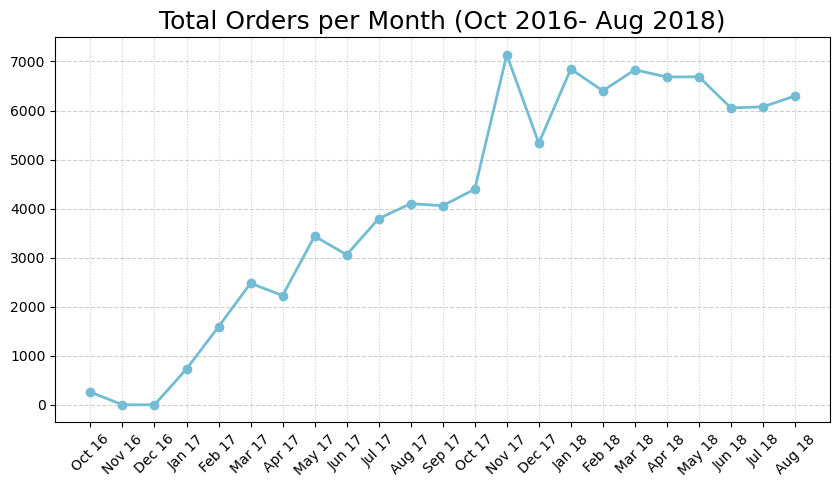

In [85]:
monthly_orders_df = all_df.resample(rule='M', on='order_purchase_timestamp').agg({
    "order_id": "nunique",
    "payment_value": "sum"
})
monthly_orders_df.index = monthly_orders_df.index.strftime('%b %y') #mengubah format order date menjadi nama bulan
monthly_orders_df = monthly_orders_df.reset_index()
monthly_orders_df.rename(columns={
    "order_id": "order_count",
    "payment_value": "revenue"
}, inplace=True)
monthly_orders_df.head().sort_values(by='revenue', ascending=False)

plt.figure(figsize=(10, 5)) 
plt.plot(monthly_orders_df["order_purchase_timestamp"], monthly_orders_df["order_count"], marker='o', linewidth=2, color="#72BCD4") 
plt.title("Total Orders per Month (Oct 2016- Aug 2018)", loc="center", fontsize=18) 
plt.xticks(fontsize=10, rotation=45) 
plt.yticks(fontsize=10)
plt.grid(linestyle='--', alpha= 0.6, which='major', axis='y')
plt.grid(linestyle='dotted', alpha= 0.6, which='major', axis='x')

plt.show()

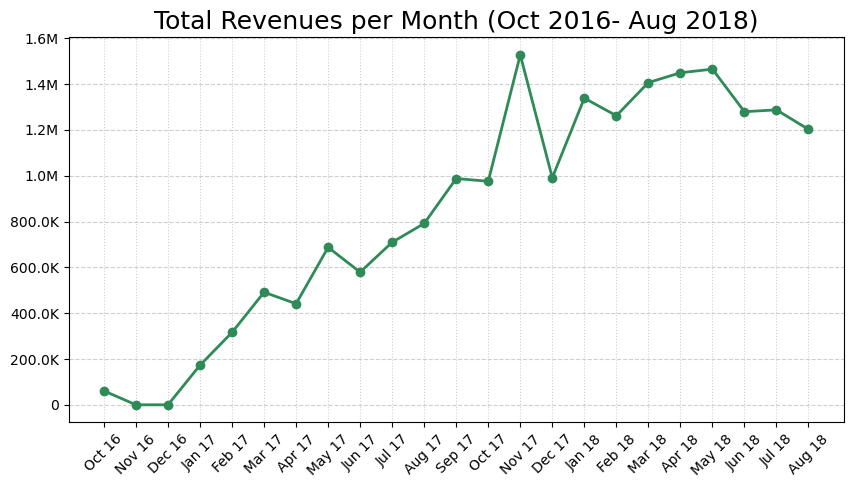

In [86]:
from matplotlib.ticker import FuncFormatter
def format_with_units(x, pos):
    if x >= 1e6:
        return f'{x/1e6:.1f}M'
    elif x >= 1e3:
        return f'{x/1e3:.1f}K'
    else:
        return f'{x:.0f}'
plt.figure(figsize=(10, 5))
plt.plot(
    monthly_orders_df['order_purchase_timestamp'], 
    monthly_orders_df['revenue'],
    marker ='o',
    color = 'seagreen',
    linewidth=2
    )
plt.title("Total Revenues per Month (Oct 2016- Aug 2018)", loc="center", fontsize=18) 
plt.xticks(fontsize=10, rotation=45) 
plt.yticks(fontsize=10)
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_units))
plt.grid(linestyle='--', alpha= 0.6, which='major', axis='y')
plt.grid(linestyle='dotted', alpha= 0.6, which='major', axis='x')
plt.show()

In [87]:
sum_orders_items_df = all_df.groupby(['product_category_name_english']).agg({
    'order_item_id' :'sum'
}).sort_values(by='order_item_id', ascending=False).reset_index()
sum_orders_revenues_df = all_df.groupby(['product_category_name_english']).agg({
    'payment_value' :'sum'
}).sort_values(by='payment_value', ascending=False).reset_index()


### Pertanyaan 2: Produk apa yang paling menghasilkan revenue dan paling laku serta produk paling tidak laku dan tidak menghasilkan revenue?


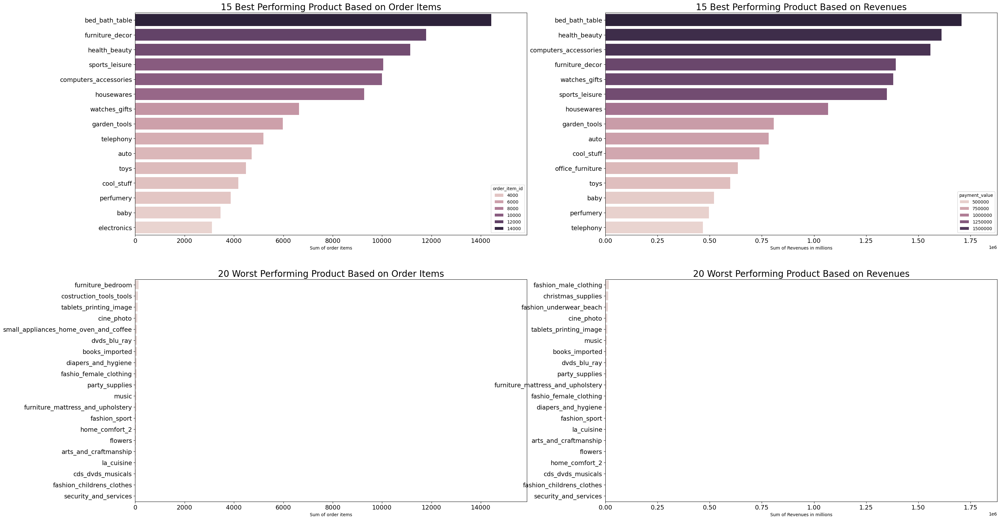

In [88]:
# Pola korelasi dari jumlah banyaknya order dengan jumlah revenue yang didapat dalam beberapa kategori produk
max_order_items = sum_orders_items_df['order_item_id'].max()
max_payment = sum_orders_revenues_df['payment_value'].max()
max_x_order = max_order_items * 1.1
max_x_payment = max_payment * 1.1

fig, ax = plt.subplots(2,2, figsize=(35,20))
sns.barplot(y='product_category_name_english', x='order_item_id', data=sum_orders_items_df.head(15), ax=ax[0, 0],hue="order_item_id")
ax[0, 0].set_ylabel(None)
ax[0, 0].tick_params(axis ='both', labelsize=14)
ax[0, 0].set_xlabel('Sum of order items')
ax[0, 0].set_title("15 Best Performing Product Based on Order Items", loc="center", fontsize=20)
ax[0, 0].set_xlim(0, max_x_order)

sns.barplot(y='product_category_name_english', x='payment_value', data=sum_orders_revenues_df.head(15), ax=ax[0, 1], hue='payment_value')
ax[0, 1].set_ylabel(None)
ax[0, 1].set_xlabel('Sum of Revenues in millions')
ax[0, 1].tick_params(axis ='both', labelsize=14)
ax[0, 1].set_title("15 Best Performing Product Based on Revenues", loc="center", fontsize=20)
ax[0, 1].set_xlim(0, max_x_payment)

sns.barplot(y='product_category_name_english', x='order_item_id', data=sum_orders_items_df.tail(20).sort_values(by='order_item_id',ascending=False), ax=ax[1, 0], color= '#e9d4d0')
ax[1, 0].set_ylabel(None)
ax[1, 0].set_xlabel('Sum of order items')
ax[1, 0].tick_params(axis= 'both', labelsize=14)
ax[1, 0].set_title("20 Worst Performing Product Based on Order Items", loc="center", fontsize=20)
ax[1, 0].set_xlim(0, max_x_order)

sns.barplot(y='product_category_name_english', x='payment_value', data=sum_orders_revenues_df.tail(20).sort_values(by='payment_value',ascending=False), ax=ax[1, 1], color= '#e9d4d0')
ax[1, 1].set_ylabel(None)
ax[1, 1].set_xlabel('Sum of Revenues in millions')
ax[1, 1].tick_params(axis ='both', labelsize=14)
ax[1, 1].set_title("20 Worst Performing Product Based on Revenues", loc="center", fontsize=20)
ax[1, 1].set_xlim(0, max_x_payment)

plt.show()

### Pertanyaan 3: State apa yang menghasilkan revenue dan jumlah order paling tinggi?

In [89]:
sum_orders_items_state_df = all_df.groupby(['customer_state']).agg({
    'order_item_id' :'sum'
}).sort_values(by='order_item_id', ascending=False).reset_index()
sum_orders_revenues_state_df = all_df.groupby(['customer_state']).agg({
    'payment_value' :'sum'
}).sort_values(by='payment_value', ascending=False).reset_index()

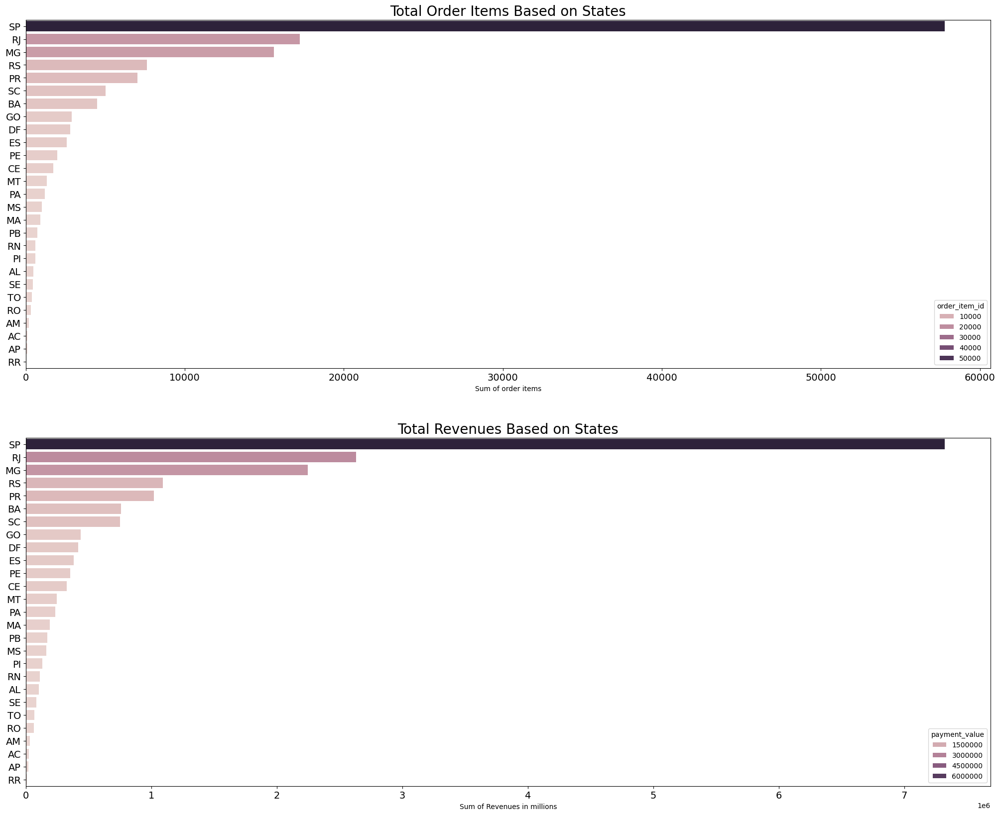

In [90]:
fig, ax = plt.subplots(2,1, figsize=(25, 20))
sns.barplot(y='customer_state', x='order_item_id', data=sum_orders_items_state_df, ax=ax[0], hue="order_item_id")
ax[0].set_ylabel(None)
ax[0].tick_params(axis ='both', labelsize=14)
ax[0].set_xlabel('Sum of order items')
ax[0].set_title("Total Order Items Based on States", loc="center", fontsize=20)

sns.barplot(y='customer_state', x='payment_value', data=sum_orders_revenues_state_df, ax=ax[1], hue="payment_value")
ax[1].set_ylabel(None)
ax[1].set_xlabel('Sum of Revenues in millions')
ax[1].tick_params(axis ='both', labelsize=14)
ax[1].set_title("Total Revenues Based on States", loc="center", fontsize=20)

plt.show()

### Pertanyaan 4: Metode pembayaran apa yang paling banyak jumlah pembayarannya dan sering digunakan  dari berbagai states?

In [91]:
payment_type_df = all_df.groupby(['customer_state', 'payment_type'])['payment_value'].sum().unstack()
payment_type_df['total'] = payment_type_df.sum(axis=1) 
payment_type_df = payment_type_df.sort_values(by='total', ascending=False).drop(columns='total')
payment_type_df.head()

payment_type,boleto,credit_card,debit_card,voucher
customer_state,,,,
SP,1455551.18,5612269.64,101543.62,152087.26
RJ,455897.67,2082298.82,41396.07,53389.33
MG,480977.97,1699006.55,25584.75,40050.10
RS,261426.66,794579.00,12315.64,25609.54
PR,219597.59,771443.51,10313.67,21443.90


In [92]:
transaction_counts_df= all_df.groupby(['customer_state', 'payment_type']).size().unstack()
transaction_counts_df['total'] = transaction_counts_df.sum(axis=1) 
transaction_counts_df = transaction_counts_df.sort_values(by='total', ascending=False).drop(columns='total')
transaction_counts_df.head()

payment_type,boleto,credit_card,debit_card,voucher
customer_state,,,,
SP,9137.0,35240.0,829.0,2616.0
RJ,2405.0,11032.0,200.0,929.0
MG,2620.0,9835.0,148.0,615.0
RS,1548.0,4395.0,76.0,294.0
PR,1249.0,4185.0,72.0,284.0


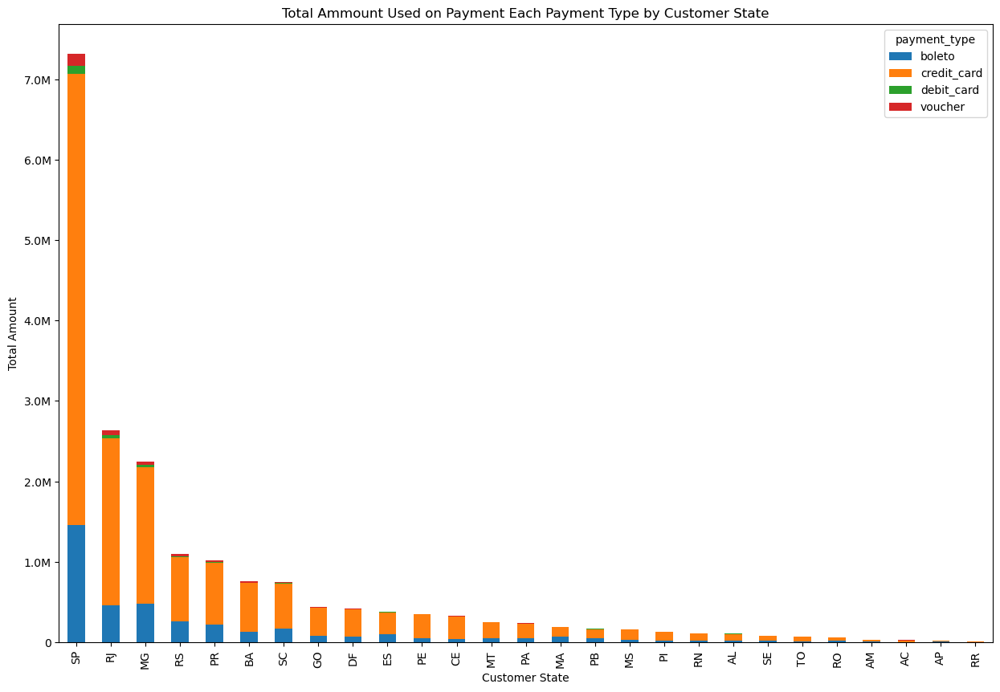

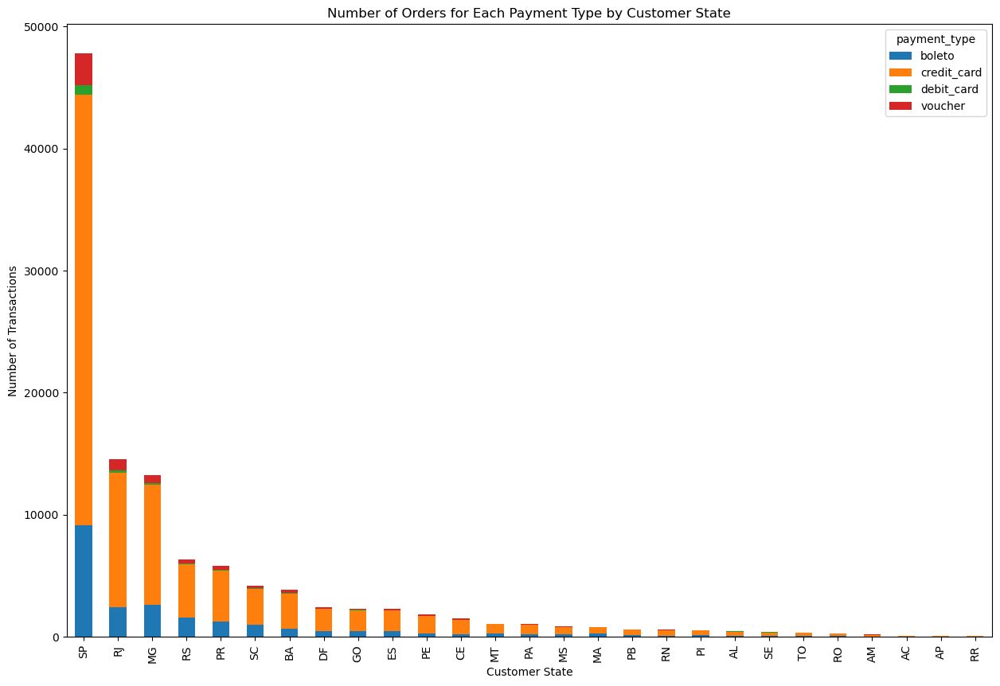

In [93]:
from matplotlib.ticker import FuncFormatter

def format_with_units(x, pos):
    if x >= 1e6:
        return f'{x/1e6:.1f}M'
    elif x >= 1e3:
        return f'{x/1e3:.1f}K'
    else:
        return f'{x:.0f}'

payment_type_df.plot(kind='bar', stacked=True, figsize=(15,10))
plt.xlabel('Customer State')
plt.ylabel('Total Amount')
plt.title('Total Ammount Used on Payment Each Payment Type by Customer State')
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_units))

transaction_counts_df.plot(kind='bar', stacked=True, figsize=(15,10))
plt.xlabel('Customer State')
plt.ylabel('Number of Transactions')
plt.title('Number of Orders for Each Payment Type by Customer State')

plt.show()

**Insight:**
- Ada kemungkinan tren musiman dengan puncak pada bulan-bulan tertentu bulan November 2017 dan Desember2017 serta penurunan pada bulan-bulan lain (seperti Februari atau Maret). Tren pendapatan seringkali sejalan dengan volume order, tetapi mungkin menunjukkan perbedaan tergantung pada promosi, kategori produk, atau order bernilai tinggi di bulan-bulan tertentu.
- bed_bath_table, furniture_decor, health beauty dan computer_accessories menjadi kategori 3 produk paling laris
- 

## Analisis Lanjutan (Opsional)

### Pertanyaan 5: RFM Analysis

In [94]:
rfm_df = all_df.groupby(by="customer_id", as_index=False).agg({
    "order_purchase_timestamp": "max", # mengambil tanggal order terakhir
    "order_id": "nunique", # menghitung jumlah order
    "payment_value": "sum" # menghitung jumlah revenue yang dihasilkan
})
rfm_df.rename(columns={
    'payment_value' : 'monetary',
    'order_id' : 'frequency',
    'order_purchase_timestamp' : 'max_order_timestamp'
}, inplace=True)
 
# menghitung kapan terakhir pelanggan melakukan transaksi (hari)
rfm_df["max_order_timestamp"] = rfm_df["max_order_timestamp"].dt.date
recent_date = all_df["order_purchase_timestamp"].dt.date.max()
rfm_df["recency"] = rfm_df["max_order_timestamp"].apply(lambda x: (recent_date - x).days)
 
rfm_df.drop("max_order_timestamp", axis=1, inplace=True)
rfm_df.head()

,customer_id,frequency,monetary,recency
0,00012a2ce6f8dcda20d059ce98491703,1,114.74,288
1,000161a058600d5901f007fab4c27140,1,67.41,409
2,0001fd6190edaaf884bcaf3d49edf079,1,195.42,547
3,0002414f95344307404f0ace7a26f1d5,1,179.35,378
4,000379cdec625522490c315e70c7a9fb,1,107.01,149


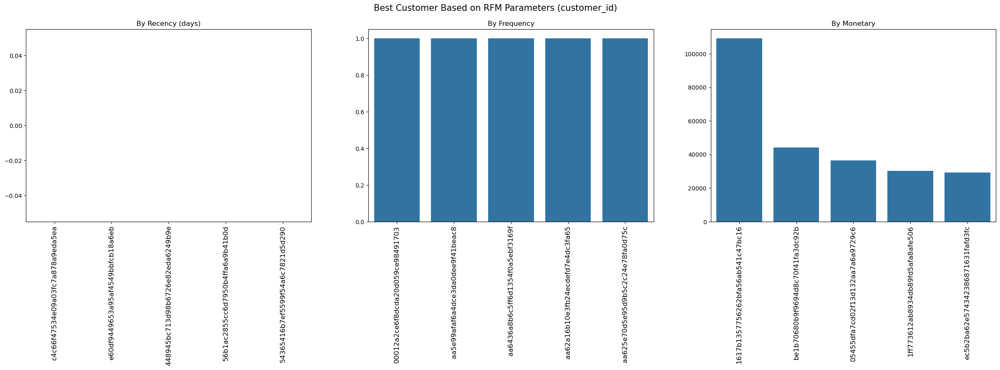

In [95]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 6))
 
sns.barplot(y="recency", x="customer_id", data=rfm_df.sort_values(by="recency", ascending=True).head(5),  ax=ax[0])
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_title("By Recency (days)", loc="center", fontsize=12)
ax[0].tick_params(axis ='x', labelsize=12, rotation=90)
 
sns.barplot(y="frequency", x="customer_id", data=rfm_df.sort_values(by="frequency", ascending=False).head(5), ax=ax[1])
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_title("By Frequency", loc="center", fontsize=12)
ax[1].tick_params(axis='x', labelsize=12, rotation=90)
 
sns.barplot(y="monetary", x="customer_id", data=rfm_df.sort_values(by="monetary", ascending=False).head(5), ax=ax[2])
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_title("By Monetary", loc="center", fontsize=12)
ax[2].tick_params(axis='x', labelsize=12, rotation=90)
 
plt.suptitle("Best Customer Based on RFM Parameters (customer_id)", fontsize=15)
plt.show()

### Pertanyaan 6: Geospatial Analysis
Bagaimana jika distribusi customer berdasarkan lokasi geografis dalam bentuk map?

In [96]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

In [97]:
customer_geolocation_df = pd.merge(customers_df, geolocation_df, 
                     left_on='customer_zip_code_prefix', 
                     right_on='geolocation_zip_code_prefix')

In [98]:
customer_geolocation_df = customer_geolocation_df.groupby('customer_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

C:\Users\Doni\AppData\Local\Temp\ipykernel_23780\4279034533.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  customer_geolocation_df = customer_geolocation_df.groupby('customer_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)


In [99]:
all_df = pd.merge(all_df, customer_geolocation_df, how='inner', on='customer_id')

In [100]:
all_df.columns

Index(['index', 'order_id', 'customer_id', 'order_status',
       'order_purchase_timestamp', 'order_estimated_delivery_date',
       'delivery_time', 'customer_unique_id_x', 'customer_zip_code_prefix_x',
       'customer_city_x', 'customer_state_x', 'status_x', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'customer_unique_id_y',
       'customer_zip_code_prefix_y', 'customer_city_y', 'customer_state_y',
       'status_y', 'geolocation_zip_code_prefix', 'geolocation_lat',
       'geolocation_lng', 'geolocation_

In [101]:
all_df.drop(columns=['customer_unique_id_y', 'customer_zip_code_prefix_y', 'customer_city_y', 'customer_state_y', 'status_y'], inplace=True)

In [102]:
all_df.rename(columns={
    'customer_unique_id_x' : 'customer_unique_id',
    'customer_zip_code_prefix_x' : 'customer_zip_code_prefix',
    'customer_city_x' : 'customer_city', 
    'customer_state_x' : 'customer_state', 
    'status_x' : 'status',
}, inplace=True)

In [103]:
all_df['customer_city'] = all_df['customer_city'].astype('category')
all_df['order_status'] = all_df['order_status'].astype('category')
all_df['customer_state'] = all_df['customer_state'].astype('category')
all_df['payment_type'] = all_df['payment_type'].astype('category')
all_df['seller_city'] = all_df['seller_city'].astype('category')
all_df['geolocation_city'] = all_df['geolocation_city'].astype('category')
all_df['geolocation_state'] = all_df['geolocation_state'].astype('category')
all_df['status'] = all_df['status'].astype('category')
all_df['product_category_name'] = all_df['product_category_name'].astype('category')
all_df['product_category_name_english'] = all_df['product_category_name_english'].astype('category')

In [104]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112912 entries, 0 to 112911
Data columns (total 41 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   index                          112912 non-null  int64         
 1   order_id                       112912 non-null  object        
 2   customer_id                    112912 non-null  object        
 3   order_status                   112912 non-null  category      
 4   order_purchase_timestamp       112912 non-null  datetime64[ns]
 5   order_estimated_delivery_date  112912 non-null  datetime64[ns]
 6   delivery_time                  112912 non-null  float64       
 7   customer_unique_id             112912 non-null  object        
 8   customer_zip_code_prefix       112912 non-null  int64         
 9   customer_city                  112912 non-null  category      
 10  customer_state                 112912 non-null  category      
 11  

In [105]:
customer_geolocation_df = customer_geolocation_df.sample(n=10000, random_state=42)

In [106]:
location_counts = customer_geolocation_df.groupby(['geolocation_lat', 'geolocation_lng', 'geolocation_city', 'geolocation_state']).size().reset_index(name='customer_count')
location_counts.head()

,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,customer_count
0,-33.527671,-53.373545,santa vitoria do palmar,RS,1
1,-32.204285,-52.179458,rio grande,RS,1
2,-32.181549,-52.170984,rio grande,RS,1
3,-32.110758,-52.175673,rio grande,RS,1
4,-32.095174,-52.179897,rio grande,RS,1


In [107]:
center_lat = location_counts['geolocation_lat'].mean()
center_lng = location_counts['geolocation_lng'].mean()
m = folium.Map(location=[center_lat, center_lng], zoom_start=6)

In [108]:
marker_cluster = MarkerCluster().add_to(m)

In [109]:
for idx, row in location_counts.iterrows():
    folium.CircleMarker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        radius=5,  # Base size of the circle
        popup=f"City: {row['geolocation_city']}, State: {row['geolocation_state']}<br>Customers: {row['customer_count']}",
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        weight=2
    ).add_to(marker_cluster)

In [110]:
m

In [111]:
m.save("simple_customer_map.html")
print("Simple customer map saved as 'simple_customer_map.html'")

Simple customer map saved as 'simple_customer_map.html'


### Pertanyaan 7: Clustering
Bagaimana jika mengkategorikan customer berdasarkan jumlah total pengeluaran untuk pembelian produk di platform ini?

In [112]:
bins = [0, 50, 200, 500, 1000, 5000, float('inf')]
customer_value_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High', 'Rich Loyalist'] 
rfm_df['spending_category'] = pd.cut(rfm_df['monetary'], bins=bins, labels=customer_value_labels, right=False)

In [113]:
rfm_count = rfm_df['spending_category'].value_counts().reset_index()

In [114]:
bins = [0, 50, 200, 500, 1000, 5000, float('inf')]
customer_value_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High', 'Rich Loyalist']
rfm_df['spending_category'] = pd.cut(rfm_df['monetary'], bins=bins, labels=customer_value_labels, right=False)
rfm_count = rfm_df['spending_category'].value_counts().reset_index()
rfm_count = rfm_count.sort_values(by='count', ascending=False)
rfm_count.head()

,spending_category,count
0,Low,55629
1,Medium,16330
2,Very Low,15831
3,High,4474
4,Very High,2103


In [115]:
all_df.to_csv('all_df.csv')

## Conclusion

## Conclusion pertanyaan 1
    Jumlah Order: Ada kemungkinan tren musiman dengan puncak pada bulan-bulan tertentu bulan November atau musim liburan di bulan Desember dan penurunan pada bulan-bulan lain, seperti Februari atau Maret.
    Total Revenue: Tren pendapatan seringkali sejalan dengan volume order, tetapi mungkin menunjukkan perbedaan tergantung pada promosi, kategori produk, atau order bernilai tinggi di bulan-bulan tertentu.
## Conclusion pertanyaan 2
    Produk Terbaik (Revenue): Kategori seperti elektronik, ponsel, atau peralatan rumah tangga cenderung menghasilkan pendapatan lebih tinggi karena harga per unit yang lebih tinggi.
    Produk Terlaris (Volume Order): Kategori hampir sama dengan produk terbaik secara revenue mungkin terjual dalam jumlah lebih banyak tetapi dengan harga yang lebih rendah.
    Produk Terburuk (Revenue & Volume): Barang-barang khusus atau produk-produk niche, terutama dalam kategori barang mewah, mungkin memiliki volume penjualan dan pendapatan yang lebih rendah.
## Conclusion pertanyaan 3
    State Terbaik: São Paulo, Rio de Janeiro, dan Minas Gerais biasanya merupakan state dengan pendapatan dan volume order tertinggi karena populasinya yang besar dan infrastruktur e-commerce yang lebih berkembang.
    State Terburuk: State yang kurang padat penduduknya atau yang infrastrukturnya kurang berkembang, seperti Acre atau Roraima, atau yang di dekat hutan amazon, mungkin menunjukkan volume order dan pendapatan yang lebih rendah.
## Conclusion pertanyaan 4
    Metode Paling Populer: Pembayaran dengan kartu kredit biasanya paling umum di berbagai state karena fleksibilitasnya untuk pembayaran secara cicilan.
## Conclusion pertanyaan 5
    RFM Tinggi: Pelanggan setia yang sering membeli dan menghabiskan banyak uang serta recency yang kecil
    RFM Rendah: Pelanggan yang tidak melakukan pembelian baru-baru ini, tidak membeli secara sering, atau menghabiskan lebih sedikit.
    Hasilnya berupa segmentasi pelanggan
## Conclusion pertanyaan 6
    Pelanggan dengan pengeluaran tinggi (High-Rich Loyalist) yang kemungkinan lebih makmur dan mungkin membeli barang-barang bernilai lebih tinggi seperti elektronik atau barang mewah.
    Pengeluaran menengah (Medium) yang membeli barang-barang dengan harga sedang, mungkin fokus pada produk rumah tangga atau perawatan pribadi.
    Pengeluaran rendah (Very Low - Low) yang mungkin hanya membeli barang-barang murah dan sering dikonsumsi seperti produk kecantikan atau kebutuhan sehari-hari.
 ## Conclusion pertanyaan 7
    Sebagian besar pelanggan terkonsentrasi di daerah metropolitan, terutama di sekitar São Paulo dan Rio de Janeiro.
    Mungkin ada wilayah yang kurang terjangkau (misalnya di bagian Barat Laut Brasil) di mana basis pelanggan jarang karena keterbatasan logistik atau hambatan ekonomi.
